# Глубинное обучение, ИИ ВШЭ

## Домашнее задание 3. Детекция объектов. 

### Общая информация

### Оценивание и штрафы

Максимально допустимая оценка за работу без бонусов — 10 баллов. Сдавать задание после указанного срока жесткого дедлайна нельзя.

Сдача работы после мягкого дедлайна штрафуется ступенчато, -1 балл в сутки. Один раз за модуль студентам предоставляется возможность использовать отсрочку и сдать в жесткий дедлайн без штрафа.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов. Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке. Также оценка может быть снижена за плохо читаемый код и плохо оформленные графики. Все ответы должны сопровождаться кодом или комментариями о том, как они были получены.

Использование генеративных моделей допустимо на следующих условиях:
- Количество кода, написанное генеративными моделями, не превышает 30%
- Указана модель, использованная для генерации, а также промпт
- В конце работы необходимо описать свой опыт использования генеративного ИИ для решения данного домашнего задания. Укажите как часто Вам приходилось исправлять код своими руками или просить модель что-то исправить. Было ли это быстрее, чем написать код самим? 

В случае невыполнения этих требований работа не оценивается и оценка за неё не превышает 0 баллов.

### О задании

Сыграем в квиддич? Или лучше в карты?

В этом дз вам предстоит написать практически с нуля архитектуру для детекции, а также воспользоваться готовым решением. На выбор даётся два датасета, отличаются они только картинками. Форматы, баллы - все одинаково.

Первый вариант это датасет по кадрам игры в квиддич из Гарри Поттера. Если вы забыли правила, то нажмите [сюда](https://harrypotter.fandom.com/ru/wiki/%D0%9A%D0%B2%D0%B8%D0%B4%D0%B4%D0%B8%D1%87). Вы научитесь искать и выделять на фотографиях бладжеры, квоффл и снитч.

Второй вариант это датасет с игральными картами. Если вы забыли что такое карты, то нажмите [сюда](https://ru.wikipedia.org/wiki/%D0%98%D0%B3%D1%80%D0%B0%D0%BB%D1%8C%D0%BD%D1%8B%D0%B5_%D0%BA%D0%B0%D1%80%D1%82%D1%8B). Вы научитесь искать и выделять на фотографиях несколько типов карт.

Оба варианта содержат около 300 картинок, данные хранятся в xml в формате PascalVOC. Есть малые отличия, но ничего страшного.


Если с самописным детектором совсем не получается, то можно после создания датасетов перейти к концу, где обучается готовый, с ним будет проще :)

### Консультация 2023 года

https://www.youtube.com/watch?v=oCwEmKW3bYg

# Notes

Дз проверялось на работоспособность в colab. Не гарантируется, что будет работать на чем-то другом. На Windows, скорее всего, вас ждет немало проблем :(

По вопросам формулировок (не ошибок торча!), в случае отсутствия ответа в общем чате (поиск по чату позволяет проверить), можно написать в него с тегом @markblumenau.

## Данные

Скачайте один из датасетов на свой вкус и начните работу с ним.
Разметка находится в xmls папке, картинки в images.

In [2]:
# Harry Potter -- uncomment
#!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip

# Cards -- uncomment
!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/cards/data.zip
import glob
import shutil
from pathlib import Path
from xml.etree import ElementTree as ET

import albumentations as A
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision
import ultralytics
from albumentations.pytorch.transforms import ToTensorV2
from matplotlib.patches import Rectangle
from PIL import Image
from torch import nn
from torchvision.models import ResNet50_Weights
from tqdm.notebook import tqdm

!unzip -q data.zip

--2025-05-09 12:21:33--  https://github.com/markblumenau/hw3_iad_dl/raw/main/cards/data.zip
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/cards/data.zip [following]
--2025-05-09 12:21:33--  https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/cards/data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 38392108 (37M) [application/zip]
Saving to: ‘data.zip’

data.zip            100%[===================>]  36,61M  9,81MB/s    in 3,9s    

2025-05-09 12:21:37 (9,49 MB/s) - ‘data.zip’ saved [38392108/38392108]



# Задача 1. 0.5 балла.

Ниже написан код для стандартного Dataset из библиотеки pytorch. Dataset требует реализации `__getitem__` и `__len__` методов. Далее эти методы будут использованы для формирования батчей для обучения. Поскольку читать придется из xml файлов, нужно перед этим дописать функцию get_xml_data, чтобы по названию картинки подтягивать аннотации.

Функции можно и нужно передать некий class_dict. Он есть и при инициализации датасета ниже. С его помощью можно название класса превратить в int. Далее подразумевается, что класс идёт как int.

In [3]:
def get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/"):
    # get smth like ZZZ/YYY/XXXXXX.jpg -> XXXXXX
    filename = image_name.split("/")[-1].split(".")[0]
    # read xml
    tree = ET.parse(str(root) + xml_prefix + filename + ".xml")
    treeroot = tree.getroot()
    # iterate over bboxes
    bboxes = []
    for member in treeroot.findall("object"):
        # you need: xmin ymin xmax ymax, class in dict
        # то есть res выглядит как [xmin, ymin, xmax, ymax, class]
        # всё в int!
        # Для корректной работы клеточек ниже требуется конкретная последовательность координат
        # См. доку https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/
        # Нас интересует pascal_voc формат, далее применяется он.
        # get class name and convert to numerical value using class_dict
        
        # имя класса
        class_name = member.find("name").text
        # id класса по словарю
        class_id = class_dict[class_name] # имя в int номер
        
        # координаты bbox
        bndbox = member.find("bndbox")
        xmin = int(bndbox.find("xmin").text)
        ymin = int(bndbox.find("ymin").text)
        xmax = int(bndbox.find("xmax").text)
        ymax = int(bndbox.find("ymax").text)
        
        # pascal_voc формат
        res = [xmin, ymin, xmax, ymax, class_id]
        bboxes.append(res)

    return bboxes

In [4]:
class PascalDataset(torch.utils.data.Dataset):
    def __init__(self, *, transform, root="dataset", train=True, seed=42):
        # путь к данным, трансформации
        self.root = Path(root)
        self.transform = transform
        assert self.root.is_dir(), f"No data at `{root}`"

        # загрузка файлов и классов
        # файлы
        self.filenames = np.array(glob.glob(root + "/images/*"))
        # словарь
        with open(str(self.root) + "/class_dict", "r") as f:
            self.class_dict = eval(f.readline())
        # обратный словарь
        self.class_dict_inv = {v: k for k, v in self.class_dict.items()}

        # разделение train / test
        np.random.seed(seed)
        # перемешивание индексов
        permutation = np.random.permutation(len(self.filenames))
        # Train/test split
        if train:
            self.filenames = self.filenames[
                permutation[: int(len(self.filenames) * 0.9)]
            ].tolist()
        else:
            self.filenames = self.filenames[
                permutation[int(len(self.filenames) * 0.9) :]
            ].tolist()

    def __getitem__(self, idx):
        # Нужно обладая файлнеймом подгрузить картинку и бибоксы, функцию для подгрузки бибоксов вы дописали выше :)

        # взятие по индексу
        fname = self.filenames[idx]

        # работа с изображением
        image = Image.open(fname)
        image = image.convert("RGB") # для совместимости с pytorch
        image = np.array(image) # в np.array для albumentations

        # подтягивание bbox по функции
        bboxes = get_xml_data(fname, self.root, self.class_dict)
        
        # transform будут объявлены ниже за вас
        # Но библиотека привередлива к формату данных на входе, внимательно прочтите прошлую клеточку
        return self.transform(image=image, bboxes=bboxes)

    def __get_raw_item__(self, idx):
        fname = self.filenames[idx]
        return fname, get_xml_data(fname, self.root, self.class_dict)

    def __len__(self):
        return len(self.filenames)

Ниже определяем стандартные нормализации и приведение размера к 512x512.


In [5]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

train_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(), # из np array в tensor
    ],
    # Вот тут мы говорим что хотим pascal_voc
    bbox_params=dict(format="pascal_voc", min_visibility=0.3),
)

test_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    bbox_params=dict(format="pascal_voc", min_visibility=0.5),
)

In [6]:
train_ds = PascalDataset(root="./data/", transform=train_transform, train=True)
test_ds = PascalDataset(root="./data/", transform=test_transform, train=False)

# Задача 2. 1 балл.

Теперь, когда мы загрузили данные, хорошо бы посмотреть на них, прежде чем обучать какие-либо модели. Напишите функцию `visualize`, которая принимает списки изображений и прямоугольников в качестве входных данных и рисует эти прямоугольники на изображениях.

В датасете есть class_dict_inv, который позволит вам сделать обратное преобразование: int, содержащий класс, в строку с названием.


Полезные функции:
* [plt.subplots](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html) -- легко создавать несколько изображений в одной pyplot figure
* [ax.imshow](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.imshow.html) -- отображение графиков (не забудьте откатить нормализацию)
* [ax.text](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.text.html), [patches.Rectangle](https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Rectangle.html) -- для рисования прямоугольников и текста с аннотацией

class_dict_inv порождается в классе (self)

In [7]:
def visualize(images, bboxes, class_dict_inv=train_ds.class_dict_inv):
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    fig, axes = plt.subplots(
        2, len(images) // 2 + len(images) % 2, figsize=(10, 8), dpi=100
    )

    for i, ax in enumerate(axes.reshape(-1)):
        ax.axis(False)

        if i >= len(images):
            break
        # Вот тут нужно выполнить permute (вспомните где у torch каналы, а где они у matplotlib)
        # И откатить нормализацию (просто обратное преобразование)
        # Имена и количества классов можно подтянуть из датасета через train_ds.class_dict_inv

        # Получаем изображение и преобразуем его
        img = images[i]
        # тензор в np.array и cмена порядка каналов
        img = img.cpu().numpy()
        img = img.transpose(1, 2, 0) # CHW -> HWC
            
        # денормализация
        img = img * std + mean
        img = np.clip(img, 0, 1)  # Ограничиваем значения [0, 1]

        # Вот тут покажите картинку после отката нормализации
        ax.imshow(img)

        for bbox in bboxes[i]:
        # Вот тут нарисуйте бибоксы
            # параметры
            xmin, ymin, xmax, ymax, class_id = bbox[:5]

            # прямоугольник
            box = plt.Rectangle(
                (xmin, ymin), # левый нижний край
                xmax - xmin, # ширина 
                ymax - ymin, # высота
                fill=False, 
                color='red', 
                linewidth=2
            )
            ax.add_patch(box)

            # подпись
            ax.text(xmin, 
                    ymin - 5, 
                    class_dict_inv.get(class_id, str(class_id)),
                    color='red', 
                    fontsize=10
                    #bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
                    )

    fig.tight_layout()
    plt.show()

У вас должно получиться что-то похожее на изображения для датасета с масками:

![image](https://i.imgur.com/V5TUT26.png)

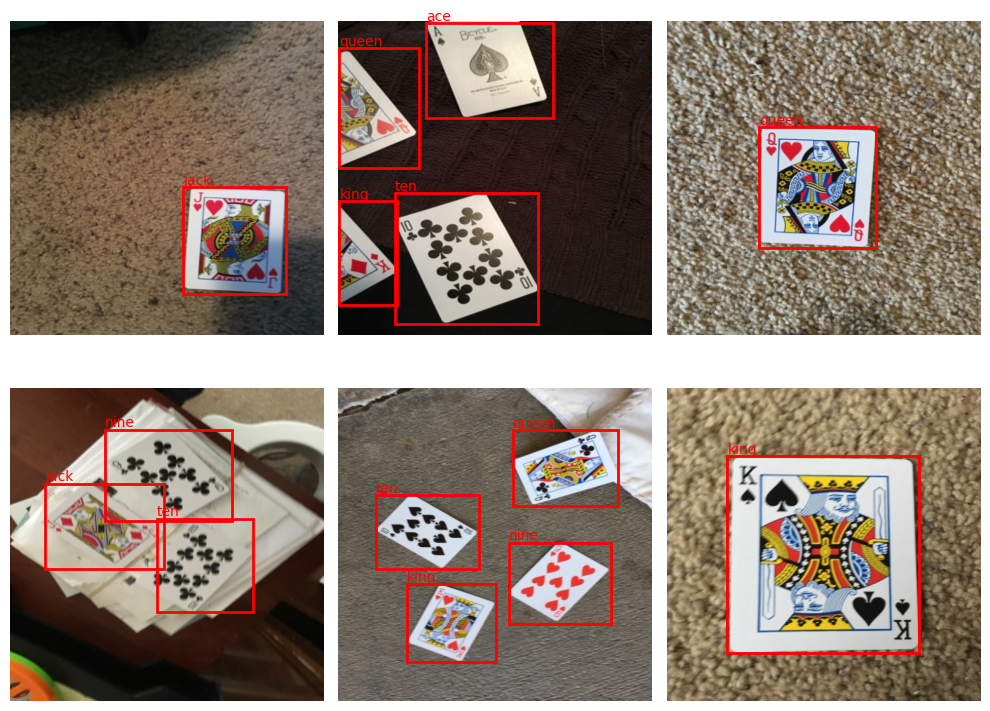

In [8]:
out = [train_ds[i] for i in range(6)]
visualize([o["image"] for o in out], [o["bboxes"] for o in out])

# Задача 3. 3 балла.
## YOLO-like детектор

Сейчас нам предстоить реализовать детектор, похожий на YOLO. Это один из самых простых детекторов с точки зрения реализации. YOLO описан в статье: [You Only Look Once: Unified, Real-Time Object Detection](https://arxiv.org/abs/1506.02640). Здесь мы его немного изменим и упростим. Будем использовать ResNet для извлечения признаков. На выходе мы будем получать карту признаков размера 16x16.

## Задача 3.1. 1 балл.

Первым делом нам нужно реализовать collate function. Это функция позволит нам кастомизировать, как именно батч конструируется из примеров (смотрите [pytorch docs](https://pytorch.org/docs/stable/data.html#dataloader-collate-fn) для деталей).

Это функция должна принять на вход лист прямоугольников и вернуть тензор размера Bx6x16x16. Первая размерность - это количество примеров в батче. Вторая -- "каналы", суть которых написана чуть ниже. Далее идут две пространственные размерности, это сетка 16 на 16. Зафиксируем порядок координат как (y, x) для этой сетки 16 на 16. Это значит, что в target идут ```cy_idx, cx_idx``` в таком порядке, см. код. 

В шести "каналах" у нас будут записаны:
* Сдвиги центра bbox относительно начала клеточки (клеточка это "гиперпиксель" на изображении 16 на 16 на выходе сети). Записаны эти сдвиги будут в клеточку, к которой относятся. 2 канала (X, Y)
* Нормализованные ширина и высота bbox. 2 канала (W, H)
* Confidence сетки. Им мы будем пользоваться, чтобы фильтровать уверенность сетки в наличии bbox в данной клетке. Таргет содержит 1 там, где bbox есть, и 0 иначе. 1 канал
* Класс детекции (тот самый int, полученный из строки с названием)

### Пояснительная картинка.

Она обладает некоторым уровнем абстракции, чёрных например должно быть 512, а зелёная должна захватывать 32 маленькие черные. Но может будет понятнее :)

![image](https://i.imgur.com/13YVxAd.jpeg)

In [9]:
def collate_fn(batch, downsample=32):
    imgs, batch_boxes = map(list, (zip(*[(b["image"], b["bboxes"]) for b in batch])))

    imgs = torch.stack(imgs) # объединение в BCHW
    b, _, h, w = imgs.shape

    target = imgs.new_zeros(b, 6, h // downsample, w // downsample) # уменьшили размерность, поделив на 32

    # Add sample index to targets
    for i, boxes in enumerate(batch_boxes):
        xmin, ymin, xmax, ymax, classes = map(
            torch.squeeze, torch.split(imgs.new_tensor(boxes), 1, dim=-1)
        )

        # Нормализуйте ширину и высоту, поделив на ширину и высоту исходного изображения
        x_cell =  w / (w // downsample)
        y_cell =  h / (h // downsample)
        
        # ширина и высота бибокса могут превышать размеры гиперпикселя
        # поэтому их мы нормируем на полноценные 512
        w_box =  (xmax - xmin) / w
        h_box =  (ymax - ymin) / h

        # Посчитайте координаты центра и сдвиги
        cx = (xmin + xmax) / 2.0
        cy = (ymin + ymax) / 2.0
        
        cx_idx = (cx / x_cell).floor().long() # (посчитайте индекс центра на карте признаков размера 16x16. Это будут как раз координаты пикселя, куда мы запишем параметры коробки)
        cy_idx = (cy / y_cell).floor().long()

        cx_box = (cx - cx_idx * x_cell) / x_cell # (посчитайте сдивиги относительно cx_idx)
        cy_box = (cy - cy_idx * y_cell) / y_cell

        # cy_idx, потом cx_idx
        target[i, :, cy_idx, cx_idx] = torch.stack(
            [cx_box, cy_box, w_box, h_box, torch.ones_like(cx_box), classes]
        )

    return {"image": imgs, "target": target}

Следующей функцией Вы можете проверить свою реализацию. Проверка не является блокирующей.

In [10]:
def test_collate_fn() -> None:
    target1 = [100, 200, 200, 300, 2]  # xmin, ymin, xmax, ymax, class
    target2_1 = [0, 250, 200, 300, 0]  # xmin, ymin, xmax, ymax, class
    target2_2 = [0, 100, 100, 300, 1]  # xmin, ymin, xmax, ymax, class

    result = collate_fn(
        [
            {"image": torch.rand((3, 512, 512)), "bboxes": [target1]},
            {"image": torch.rand((3, 512, 512)), "bboxes": [target2_1, target2_2]},
        ]
    )

    # Проверяем размерности
    assert result["image"].shape == (2, 3, 512, 512)
    assert result["target"].shape == (2, 6, 16, 16)

    # Проверяем значения клеточек, в которые попали ббоксы
    assert np.allclose(
        result["target"][0, :, 7, 4],
        torch.tensor([22 / 32, 26 / 32, 100 / 512, 100 / 512, 1, 2]),
    )
    assert np.allclose(
        result["target"][1, :, 8, 3],
        torch.tensor([4 / 32, 19 / 32, 200 / 512, 50 / 512, 1, 0]),
    )
    assert np.allclose(
        result["target"][1, :, 6, 1],
        torch.tensor([18 / 32, 8 / 32, 100 / 512, 200 / 512, 1, 1]),
    )

    # Проверяем, что все остальные клеточки содержат нули
    result["target"][0, :, 7, 4] = result["target"][1, :, 8, 3] = result["target"][
        1, :, 6, 1
    ] = torch.zeros(6)
    assert np.allclose(result["target"], 0)


test_collate_fn()

Ниже вы можете увидеть пример, как выглядит решетка размера 16 на 16 на исходном изображении:

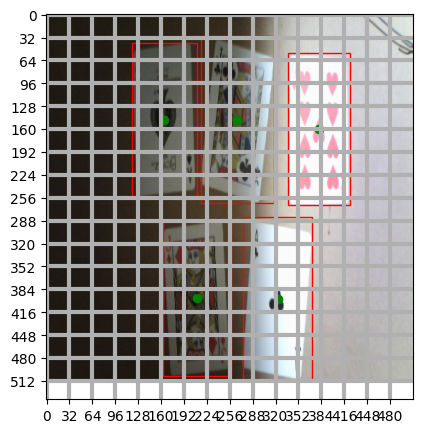

In [11]:
fig, ax = plt.subplots(figsize=(5, 5))
i = 20

img = train_ds[i]["image"].permute(1, 2, 0) * torch.tensor(std).view(
    1, 1, -1
) + torch.tensor(mean).view(1, 1, -1)
bboxes = torch.tensor(train_ds[i]["bboxes"])

ax.imshow(img)
loc = plt.matplotlib.ticker.MultipleLocator(base=32)
ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)
ax.grid(which="major", axis="both", linestyle="-", linewidth=3)

for bbox in bboxes:
    xmin, ymin, xmax, ymax = bbox[:-1]
    w = xmax - xmin
    h = ymax - ymin
    with_mask = bbox[-1]
    ax.add_patch(Rectangle((xmin, ymin), w, h, fill=False, color="red"))

cx = (bboxes[:, 0] + bboxes[:, 2]) / 2
cy = (bboxes[:, 1] + bboxes[:, 3]) / 2

ax.scatter(cx, cy, color="green", marker="o")

plt.show()

## Задача 3.2. 0.5 балла.

Выход нашей сетки будет несколько больше, чем Bx6x16x16. Почему? 

Мы решаем задачу, где классов больше одного. Вспомним прошлое дз: target был одним числом, но выход сетки содержал длинный-длинный вектор, из которого мы получали вероятность принадлежности к тому или иному классу. Здесь то же самое, но как бы в двумерии: у каждой клеточки из этих 16*16 будет свой вектор длины C, который мы будем использовать для определения класса.

Реализуйте обратное относительно collate_fn преобразования, чтобы декодировать выход нейронной сети. Применив функцию decode_prediction к выходу collate function вы должны получить изначальный набор прямоугольников с корректными размерами и координатами, а также классами. Применив к выходу нейросети мы тоже должны получить набор прямоугольников и тоже с корректными классами. 

То есть, нужно проделать операции из collate_fn в обратную сторону, но учесть, что у неройнки выход будет чуть длиннее, и там мы должны брать argmax для определения класса.

Hint: в target classes идут в конце. В нейронке они тоже будут в конце, но их будет больше 1. Можно проверять число каналов пришедшего объекта, если оно 6, то перед нами target и надо брать значение, которое записано в клеточке. Иначе (каналов больше 6) перед нами выход нейронки, и надо брать самый вероятный из них.

In [13]:
from typing import List

def decode_prediction(pred, upsample=32, threshold=0.7) -> List[List[List[float]]]:
    b, c, h, w = pred.shape
    img_w, img_h = w * upsample, h * upsample
    result = []
    
    # размер клетки в px исходного изображения
    x_cell = img_w / w
    y_cell = img_h / h
    
    for batch_idx in range(b):
        batch_boxes = []
        
        for cy_idx in range(h):
            for cx_idx in range(w):
                # Проверяем confidence
                if c == 6:  # Это target
                    confidence = pred[batch_idx, 4, cy_idx, cx_idx]
                    class_id = int(pred[batch_idx, 5, cy_idx, cx_idx])  # Просто приводим к int
                else:  # Это выход нейронки
                    confidence = pred[batch_idx, 4, cy_idx, cx_idx]
                    class_probs = pred[batch_idx, 5:, cy_idx, cx_idx]
                    class_id = torch.argmax(class_probs).item()  # Для тензора используем item()
                
                if confidence < threshold:
                    continue
                
                # параметры bbox
                cx_box = pred[batch_idx, 0, cy_idx, cx_idx].item() # сдвиг центра по X относительно клетки
                cy_box = pred[batch_idx, 1, cy_idx, cx_idx].item() # сдвиг центра по Y 
                w_box = pred[batch_idx, 2, cy_idx, cx_idx].item() # норм ширина box'а
                h_box = pred[batch_idx, 3, cy_idx, cx_idx].item() # норм высота box'а
                
                # абсолютные координаты
                # центр
                cx = (cx_idx + cx_box) * x_cell # абс X центра
                cy = (cy_idx + cy_box) * y_cell # абс Y центра
                width = w_box * img_w # абс ширина
                height = h_box * img_h # абс высота
                # края bbox
                xmin = max(0, cx - width / 2) 
                ymin = max(0, cy - height / 2)
                xmax = min(img_w - 1, cx + width / 2)
                ymax = min(img_h - 1, cy + height / 2)
                
                batch_boxes.append([xmin, ymin, xmax, ymax, float(class_id)])
        
        result.append(batch_boxes)
    
    return result

Следующей функцией Вы можете проверить свою реализацию. Проверка не является блокирующей.

In [14]:
def test_decode_predictions() -> None:
    # Применяем collate_fn к некоторым данным
    target1 = [[100, 200, 200, 300, 2]]
    target2 = [[0, 250, 200, 300, 0], [0, 100, 100, 300, 1]]
    result = collate_fn(
        [
            {"image": torch.rand((3, 512, 512)), "bboxes": target1},
            {"image": torch.rand((3, 512, 512)), "bboxes": target2},
        ]
    )

    target = result["target"]
    assert target.shape == (2, 6, 16, 16)
    # В таком виде target соответствует поиску одного класса - 6-ой канал.
    # Добавим еще 2 канала, чтобы проверить работу функции для нескольких классов
    target = torch.cat(
        [target, torch.zeros(2, 2, 16, 16)], dim=1
    )  # Добавляем два канала
    assert target.shape == (2, 8, 16, 16)  # Теперь их стало 8

    target[0, 5:, 7, 4] = torch.tensor([0.5, 0.6, 0.9])  # Это должен быть класс 2
    target[1, 5:, 8, 3] = torch.tensor([0.9, 0.6, 0.5])  # Это должен быть класс 0
    target[1, 5:, 6, 1] = torch.tensor([0.6, 0.9, 0.5])  # Это должен быть класс 1

    # Считаем результат
    actual = decode_prediction(target)
    print("Actual:  ", actual)

    # Порядок ббоксов для target2 может меняться в зависимости от вашей реализации и это не ошибка.
    # Скорее всего, он будет такой. Но если ассерт не проходит, попробуйте поменять их местами.
    expected = [target1, [target2[1], target2[0]]]
    # expected = [ target1, [ target2[0], target2[1] ] ] # <-- такой ответ тоже правильный.
    print("Expected:", expected)

    # Сравниваем
    assert actual == expected


test_decode_predictions()

Actual:   [[[100.0, 200.0, 200.0, 300.0, 2.0]], [[0, 100.0, 100.0, 300.0, 1.0], [0, 250.0, 200.0, 300.0, 0.0]]]
Expected: [[[100, 200, 200, 300, 2]], [[0, 100, 100, 300, 1], [0, 250, 200, 300, 0]]]


## Задача 3.3. 1 балл.
Реализуйте модель. Первым делом примените первые 4 блока (до layer4 включительно, можно при помощи ```list(model.children())[:-2]```) ResNet50. Далее добавьте несколько блоков (Conv2D, BatchNorm2D, ReLU). Постепенно уменьшайте количество каналов до 5+C, а размер изображения до 16 на 16. Например, 2048 -> 512 -> 128 -> 32 -> 5+C, где С - количество классов в вашем датасете. Размер ядра при этом 3, паддинг 1. Но вариантов много, попробуйте разные! **Последним слоем обязательно должна быть свертка.** Так как все значения, которые мы предсказываем, находятся в отрезке от 0 до 1 (благодаря нормировке с клеточками), мы после финальной свертки еще применим сигмоиду. Для классов в такой постановке это не навредит.

Если будете фантазировать, то для получения правильного размера изображения после сети не стесняйтесь применять слои с фильтрами больше 3.

In [ ]:
C = 6 # Количество классов в вашем датасете, хоть руками посчитайте, хоть подтяните из словаря классов

class Detector(nn.Module):
    def __init__(self, num_classes=C):
        super().__init__()
        self.num_classes = num_classes
        
        # предобученный ResNet50
        resnet = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
        
        # первые 4 блока включительно
        self.backbone = nn.Sequential(*list(resnet.children())[:-2])
        
        # свертка для уменьшения размерности
        self.conv = nn.Sequential(
            # 2048 -> 512
            nn.Conv2d(2048, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(), # inplace=True
            
            # 512 -> 128
            nn.Conv2d(512, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(), # inplace=True
            
            # 128 -> 32
            nn.Conv2d(128, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(), # inplace=True
            
            # 32 -> (5 + num_classes)
            nn.Conv2d(32, 5 + num_classes, kernel_size=3, padding=1),
            
            # сигмоида
            nn.Sigmoid()
        )

    def forward(self, x):
        # первые 4 слоя resnet
        features = self.backbone(x)
        
        # доп слои
        output = self.conv(features)
        
        return output

## Задача 3.4. 0.5 балла.

Реализуйте функцию потерь.

Для этого:
* Сделайте маску, которая будет говорить о положении детектируемых объектов. Её нужно использовать с помощью masked_select (см. доки PyTorch)
* Лосс похож на оригинальный для Yolo V1 и состоит из 4 частей (reduction='sum' для всех)
    - localization loss - Мы берем MSE по координатам бокса там, где есть детектируемый объект
    - box_loss - MSE от корней ширины и высоты bbox там, где есть детектируемый объект
    - classification_loss - Если детектируемый объект есть, то его кросс-энтропия по его классу
    - confidence_loss - Бинарная кросс-энтропия факта наличия объекта ДЛЯ ВСЕХ пикселей. Делается отдельно для детектируемых объектов (вес 1) и для недетектируемых (вес 0.1 например, поскольку их гораздо больше, но можно экспериментировать)


* Если будете делать описанное выше, то учтите reduction. Бинарная кросс-энтропия вызывается через BCELoss. Параметр C используется для задачи числа классов. Подумайте как зависит индексация от параметра C и используйте его.

In [17]:
import torch.nn.functional as F

In [63]:
def special_loss(pred, target, C=6):

    # маска пикселей, где есть объект (confidence > 0)
    obj_mask = (target[:, 4, :, :] > 0).unsqueeze(1)  # Добавляем dimension для каналов -> (B, 1, H, W)
    # кол-во клеток, где есть объект
    num_obj = obj_mask.sum().float()
    
    # localization loss
    # маска
    pred_xy = pred[:, :2, :, :]  # (B, 2, H, W)
    target_xy = target[:, :2, :, :]
    # MSE
    localization_loss = F.mse_loss(pred_xy[obj_mask.expand_as(pred_xy)], 
                                   target_xy[obj_mask.expand_as(target_xy)], 
                                   reduction='sum'
                                   ) / num_obj
    
    # box loss
    # маска
    pred_wh = torch.sqrt(pred[:, 2:4, :, :].clamp(min=1e-6))  # (B, 2, H, W)
    target_wh = torch.sqrt(target[:, 2:4, :, :])
    # MSE
    box_loss = F.mse_loss(pred_wh[obj_mask.expand_as(pred_wh)], 
                          target_wh[obj_mask.expand_as(target_wh)], 
                          reduction='sum'
                          ) / num_obj
    
    # сlassification loss
    # маска
    pred_class = pred[:, 5:5+C, :, :]  # (B, C, H, W)
    target_class = target[:, 5, :, :].long()  # (B, H, W)
    # кросэнтропия
    classification_loss = F.cross_entropy(pred_class.permute(0, 2, 3, 1)[obj_mask.squeeze(1)],  # (num_obj, C)
                                          target_class[obj_mask.squeeze(1)],                     # (num_obj,)
                                          reduction='sum'
                                          ) / num_obj
    
    # сonfidence loss
    # маска
    pred_conf = pred[:, 4, :, :]  # (B, H, W)
    target_conf = target[:, 4, :, :]
    # веса для положительных и отрицательных примеров (меньше штраф для пустых клеток)
    pos_weight = torch.ones_like(target_conf)
    neg_weight = torch.ones_like(target_conf) * 0.1
    weights = torch.where(obj_mask.squeeze(1), pos_weight, neg_weight)
    # Бинарная кросэнтропия
    confidence_loss = F.binary_cross_entropy(pred_conf, 
                                             target_conf, 
                                             weight=weights, 
                                             reduction='sum'
                                             ) / (pred.size(0) * pred.size(2) * pred.size(3))  # нормализация по всем пикселям
    
    return localization_loss + box_loss + classification_loss + confidence_loss

# Задача 4. 1 балла.

Обучите вашу модель (написав цикл обучения), и покажите что она работает (скорее всего, объекты найдутся на 1-2 картинках).

In [64]:
loader = torch.utils.data.DataLoader(train_ds, 10, collate_fn=collate_fn)

In [65]:
device = 'mps'

torch.manual_seed(21)
EPOCHS = 15 # Harry Potter 20, Cards 15
model = Detector().to(device)
opt = torch.optim.AdamW(model.parameters(), lr=1e-3)

for e in tqdm(range(EPOCHS)):
    pbar = tqdm(loader, leave=False)
    epoch_losses = []
    
    model.train()
    
    for batch in pbar:
        images = batch['image'].to(device)
        targets = batch['target'].to(device)
        
        opt.zero_grad()
        preds = model(images)
        loss = special_loss(preds, targets, C=6)
        
        loss.backward()
        opt.step()
    
        epoch_losses.append(loss.item())
        pbar.set_description(f"Loss: {loss.item():.4f}")
    
    print(f"Epoch {e} done; Train loss {np.mean(epoch_losses):.3f}")

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 0 done; Train loss 1.704


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 1 done; Train loss 1.428


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 2 done; Train loss 1.365


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 3 done; Train loss 1.335


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 4 done; Train loss 1.331


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 5 done; Train loss 1.293


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 6 done; Train loss 1.275


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 7 done; Train loss 1.257


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 8 done; Train loss 1.214


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 9 done; Train loss 1.172


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 10 done; Train loss 1.153


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 11 done; Train loss 1.150


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 12 done; Train loss 1.147


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 13 done; Train loss 1.158


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 14 done; Train loss 1.150


Запустим обученный детектор на тестовых изображениях:

In [66]:
test_loader = torch.utils.data.DataLoader(test_ds, 6, collate_fn=collate_fn)
i = iter(test_loader)
batch = next(i)

In [67]:
# Нужно сделать предсказание и переложить результат на cpu

model.eval()
images = batch['image'].to(device)
targets = batch['target'].to(device)

with torch.no_grad():
    predictions = model(images)

predictions_cpu = predictions.cpu()
targets_cpu = targets.cpu()
images_cpu = images.cpu()

# декодируем
decoded_preds = decode_prediction(predictions_cpu)
decoded_targets = decode_prediction(targets_cpu)

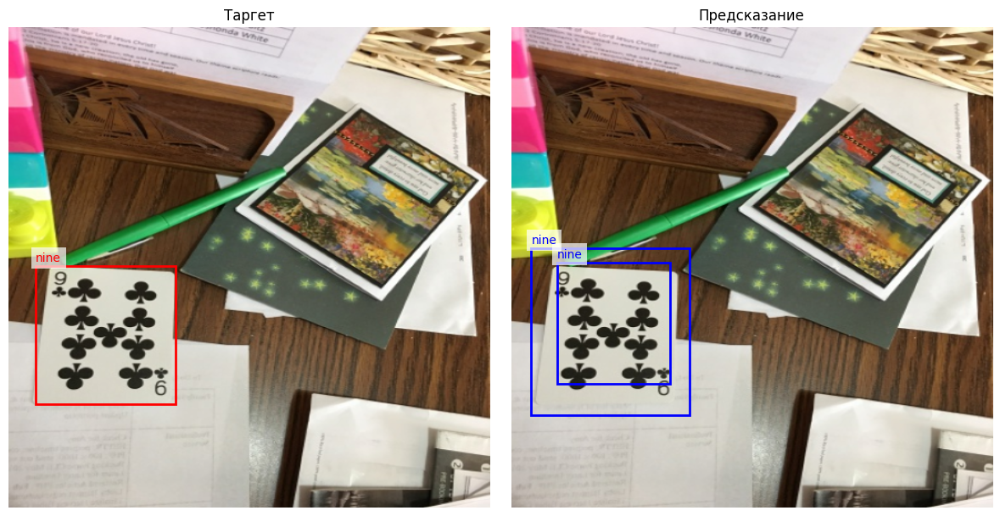

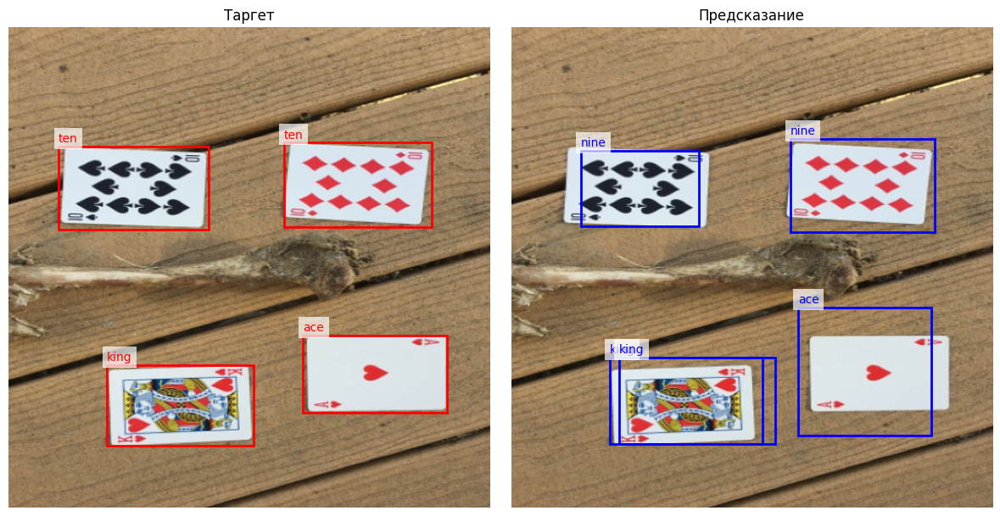

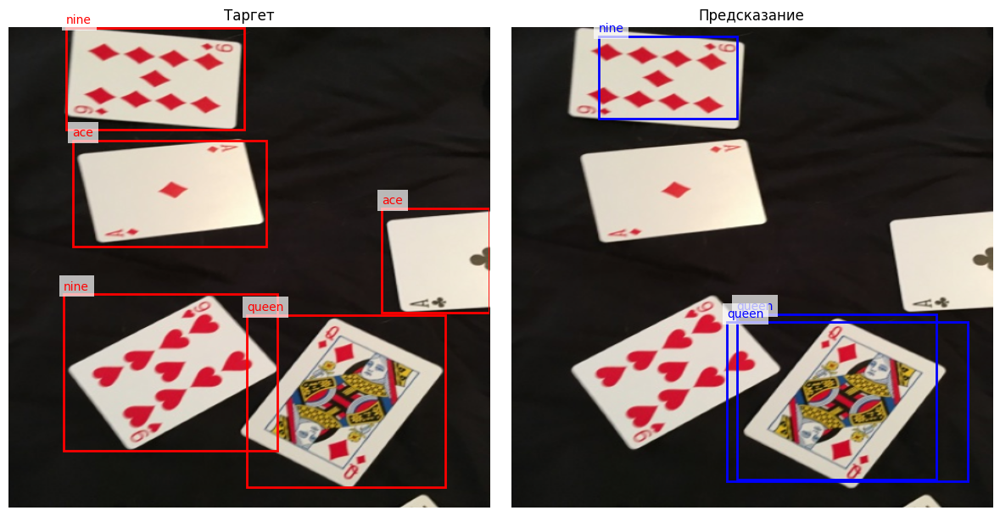

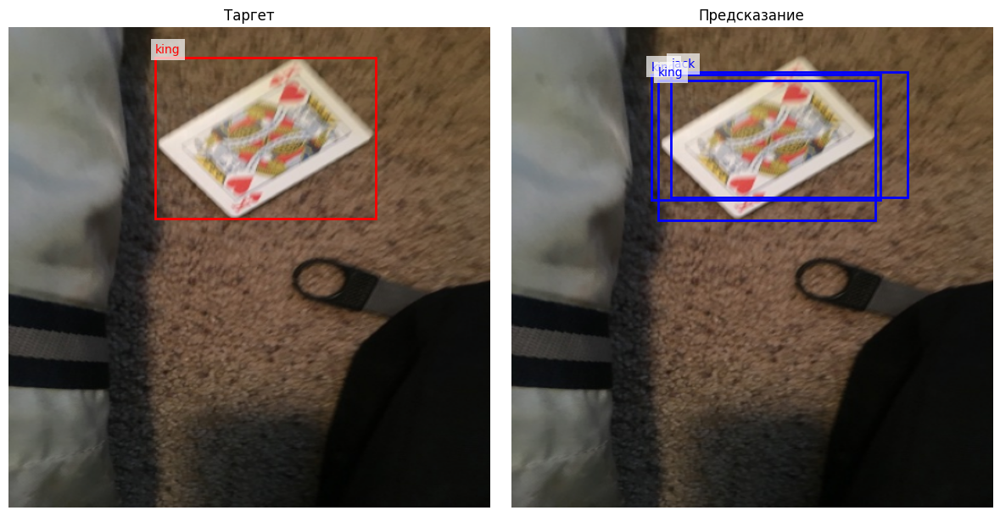

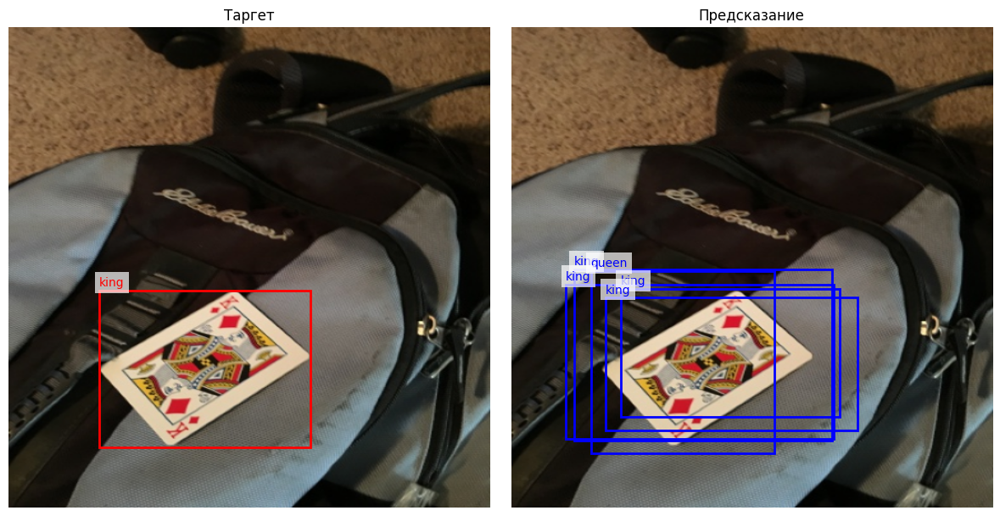

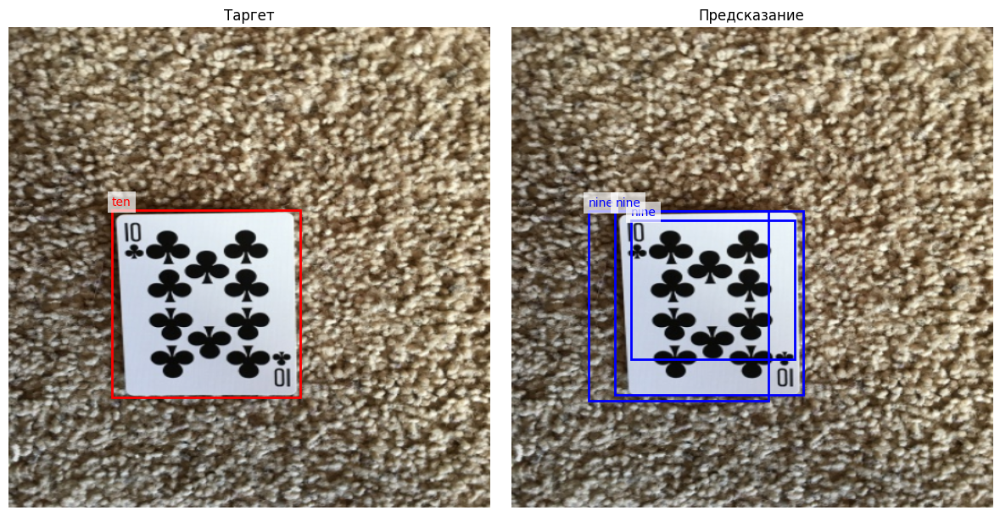

In [68]:
# Сделайте визуализацию. Поиграйтесь с threshold, скорее всего нужно понизить до ~0.1

for i in range(len(images_cpu)):

    # преобразование для виз
    img = images_cpu[i].permute(1, 2, 0).numpy()
    img = (img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406]))  # денормализация
    img = np.clip(img, 0, 1)
    
    # Создаем фигуру
    plt.figure(figsize=(12, 6))
    
    # оригинал с таргетами
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    # bbox
    for bbox in decoded_targets[i]:
        xmin, ymin, xmax, ymax, class_id = bbox
        rect = plt.Rectangle((xmin, ymin), 
                             xmax-xmin, 
                             ymax-ymin, 
                            fill=False, 
                            color='red', 
                            linewidth=2)
        plt.gca().add_patch(rect)
        # подпись
        plt.text(xmin, 
                 ymin-5, 
                 test_ds.class_dict_inv[int(class_id)], 
                color='red', fontsize=10,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
    plt.title('Таргет')
    plt.axis('off')
    
    # оригинал с предсказаниями
    plt.subplot(1, 2, 2)
    plt.imshow(img)
    # bbox
    for bbox in decoded_preds[i]:
        xmin, ymin, xmax, ymax, class_id = bbox
        rect = plt.Rectangle((xmin, ymin), 
                             xmax-xmin, 
                             ymax-ymin, 
                            fill=False, 
                            color='blue', 
                            linewidth=2)
        plt.gca().add_patch(rect)
        # подпись
        plt.text(xmin, 
                 ymin-5, 
                 test_ds.class_dict_inv[int(class_id)], 
                color='blue', fontsize=10,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
    plt.title('Предсказание')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

Не все объекты были размечены - понизим threshold

In [69]:
model.eval()
images = batch['image'].to(device)
targets = batch['target'].to(device)

with torch.no_grad():
    predictions = model(images)

predictions_cpu = predictions.cpu()
targets_cpu = targets.cpu()
images_cpu = images.cpu()

# декодируем
decoded_preds = decode_prediction(predictions_cpu, threshold=0.5)
decoded_targets = decode_prediction(targets_cpu, threshold=0.5)

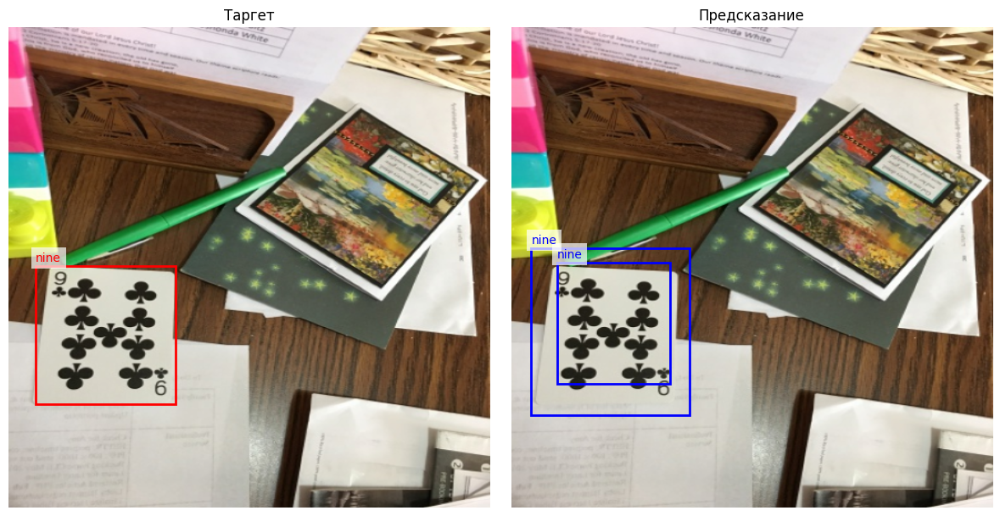

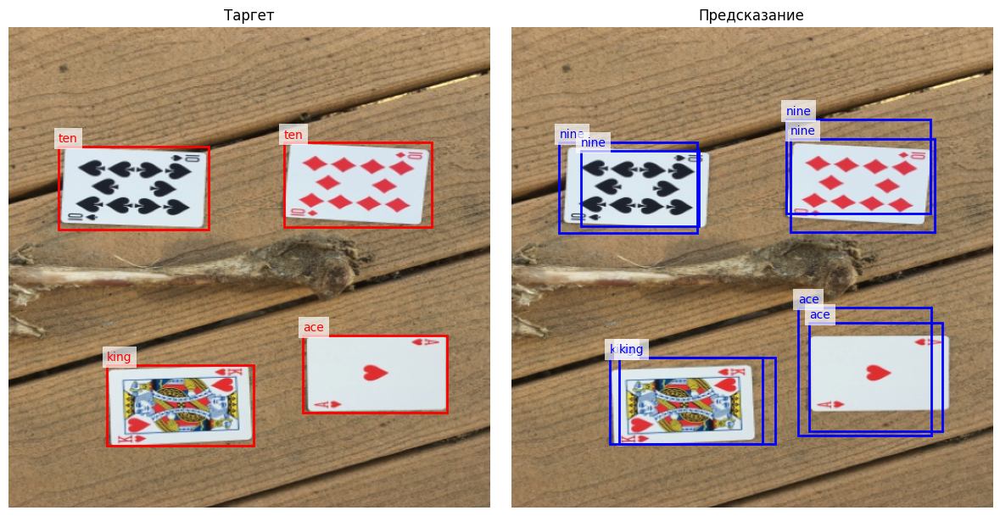

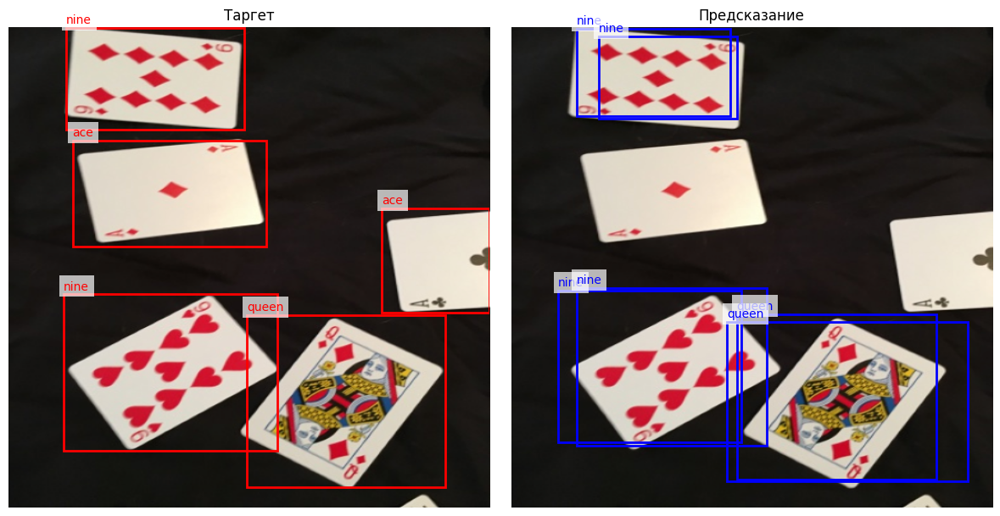

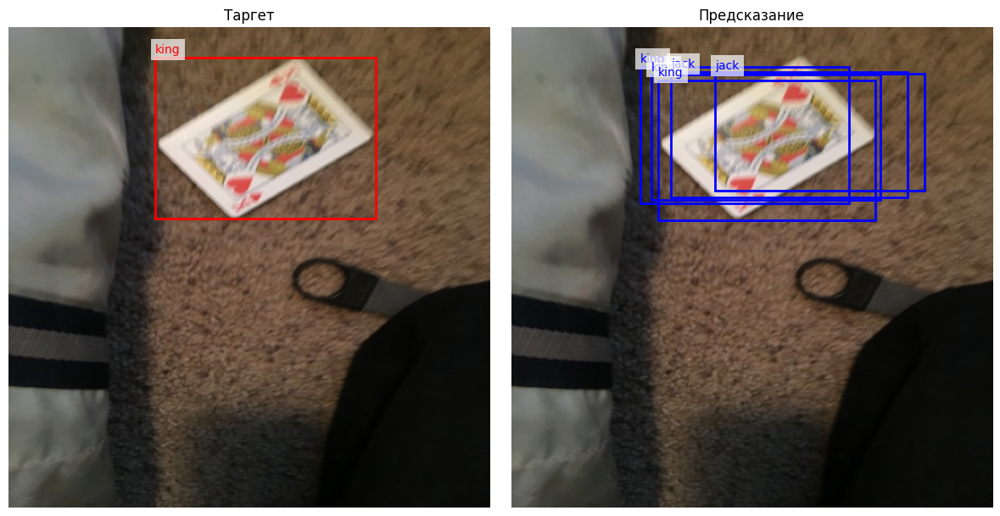

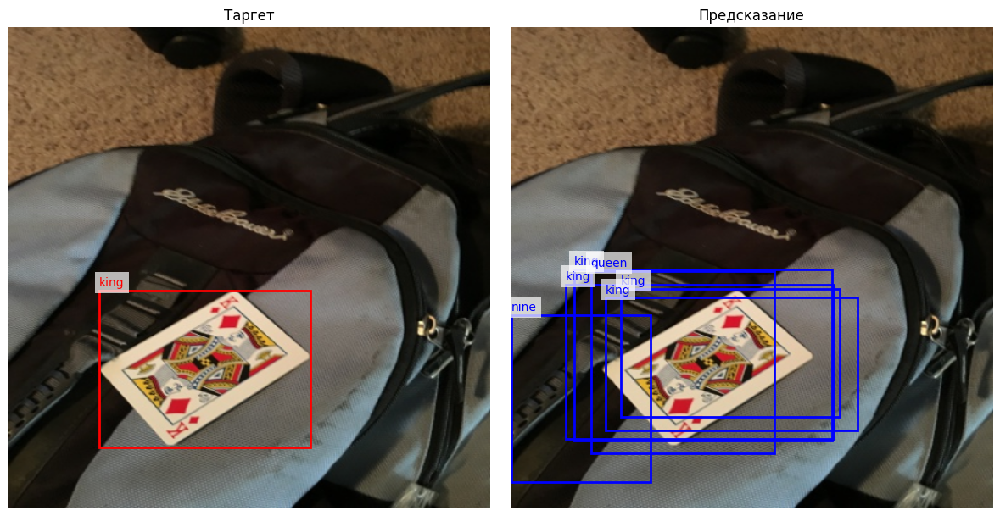

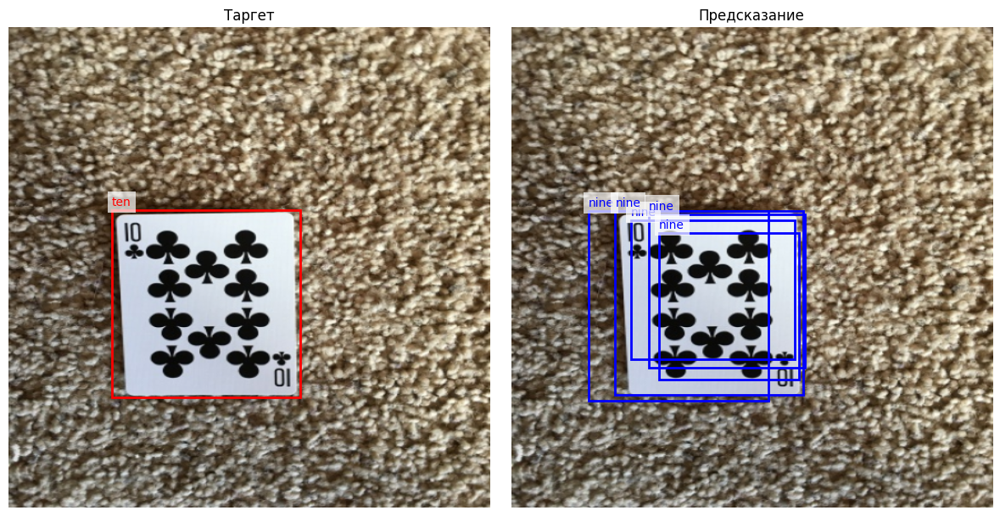

In [70]:
for i in range(len(images_cpu)):

    # преобразование для виз
    img = images_cpu[i].permute(1, 2, 0).numpy()
    img = (img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406]))  # денормализация
    img = np.clip(img, 0, 1)
    
    # Создаем фигуру
    plt.figure(figsize=(12, 6))
    
    # оригинал с таргетами
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    # bbox
    for bbox in decoded_targets[i]:
        xmin, ymin, xmax, ymax, class_id = bbox
        rect = plt.Rectangle((xmin, ymin), 
                             xmax-xmin, 
                             ymax-ymin, 
                            fill=False, 
                            color='red', 
                            linewidth=2)
        plt.gca().add_patch(rect)
        # подпись
        plt.text(xmin, 
                 ymin-5, 
                 test_ds.class_dict_inv[int(class_id)], 
                color='red', fontsize=10,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
    plt.title('Таргет')
    plt.axis('off')
    
    # оригинал с предсказаниями
    plt.subplot(1, 2, 2)
    plt.imshow(img)
    # bbox
    for bbox in decoded_preds[i]:
        xmin, ymin, xmax, ymax, class_id = bbox
        rect = plt.Rectangle((xmin, ymin), 
                             xmax-xmin, 
                             ymax-ymin, 
                            fill=False, 
                            color='blue', 
                            linewidth=2)
        plt.gca().add_patch(rect)
        # подпись
        plt.text(xmin, 
                 ymin-5, 
                 test_ds.class_dict_inv[int(class_id)], 
                color='blue', fontsize=10,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
    plt.title('Предсказание')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

При threshold стало больше объектов, но еще не все - уменьшим до 0.1

In [71]:
model.eval()
images = batch['image'].to(device)
targets = batch['target'].to(device)

with torch.no_grad():
    predictions = model(images)

predictions_cpu = predictions.cpu()
targets_cpu = targets.cpu()
images_cpu = images.cpu()

# декодируем
decoded_preds = decode_prediction(predictions_cpu, threshold=0.1)
decoded_targets = decode_prediction(targets_cpu, threshold=0.1)

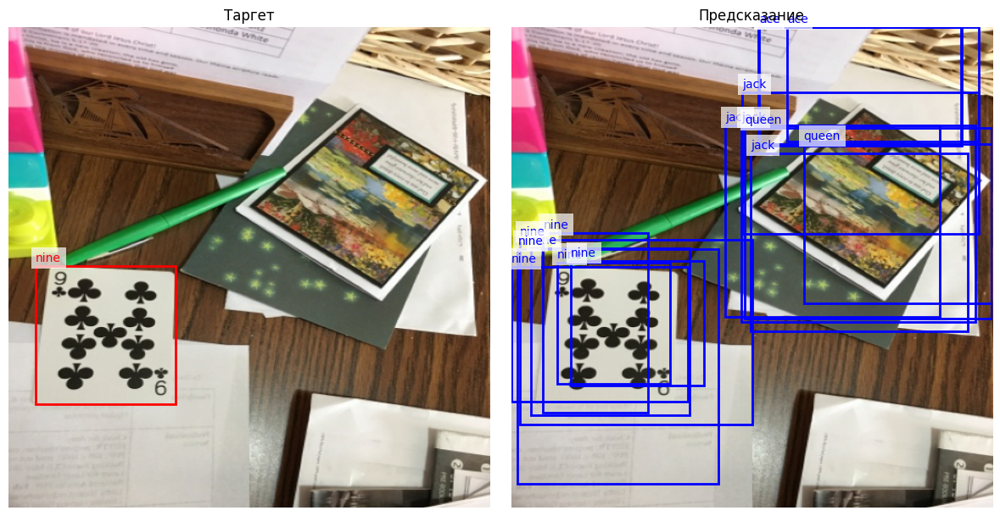

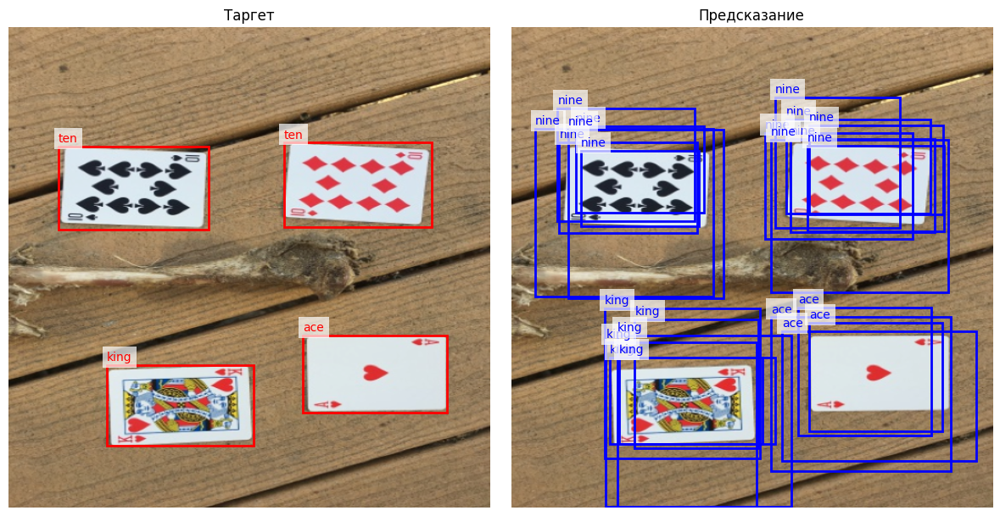

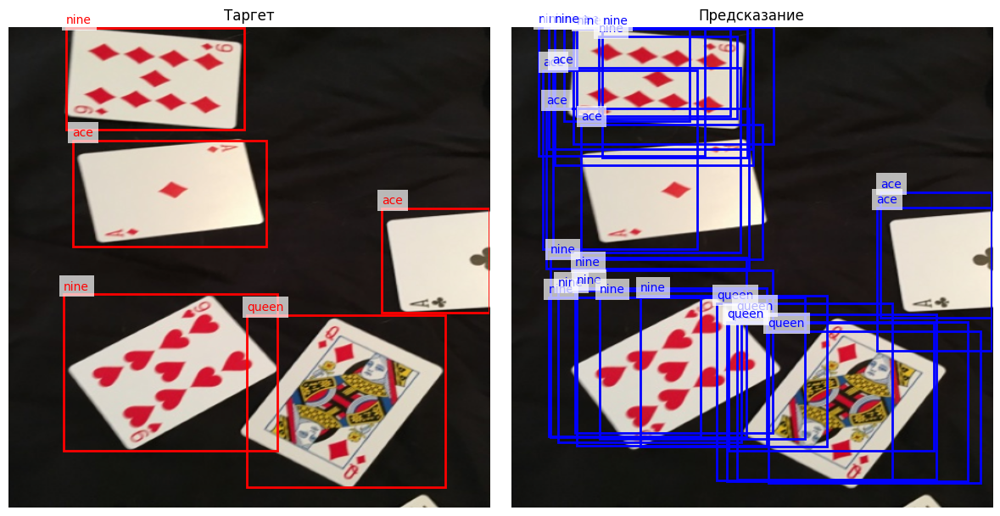

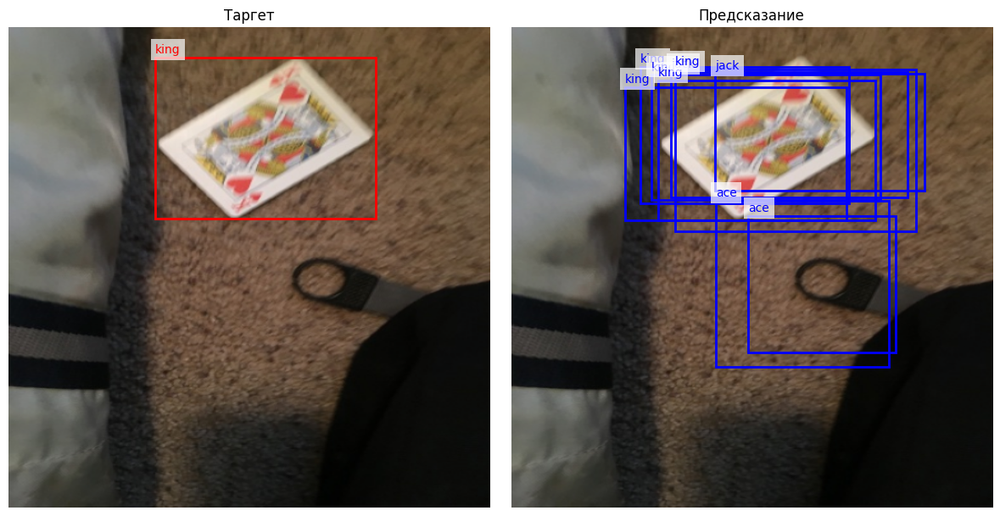

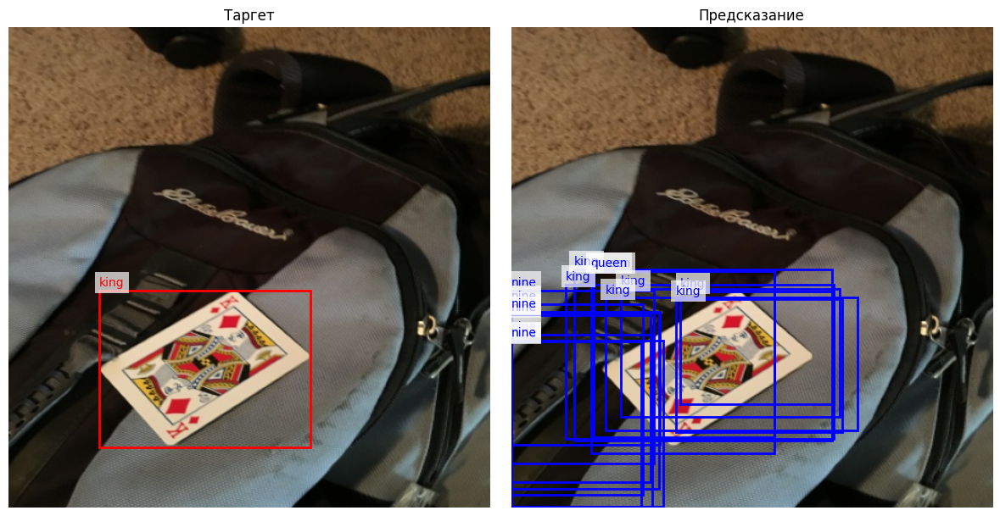

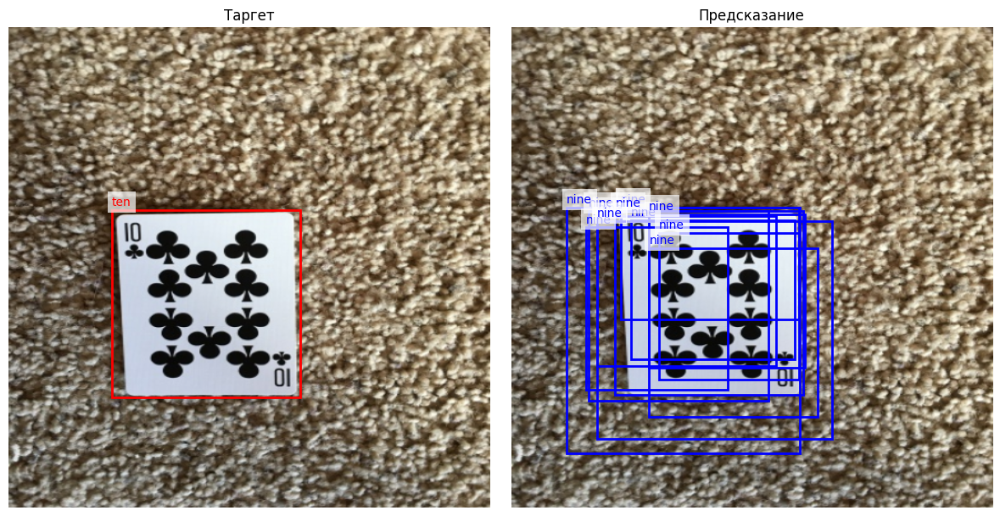

In [72]:
for i in range(len(images_cpu)):

    # преобразование для виз
    img = images_cpu[i].permute(1, 2, 0).numpy()
    img = (img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406]))  # денормализация
    img = np.clip(img, 0, 1)
    
    # Создаем фигуру
    plt.figure(figsize=(12, 6))
    
    # оригинал с таргетами
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    # bbox
    for bbox in decoded_targets[i]:
        xmin, ymin, xmax, ymax, class_id = bbox
        rect = plt.Rectangle((xmin, ymin), 
                             xmax-xmin, 
                             ymax-ymin, 
                            fill=False, 
                            color='red', 
                            linewidth=2)
        plt.gca().add_patch(rect)
        # подпись
        plt.text(xmin, 
                 ymin-5, 
                 test_ds.class_dict_inv[int(class_id)], 
                color='red', fontsize=10,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
    plt.title('Таргет')
    plt.axis('off')
    
    # оригинал с предсказаниями
    plt.subplot(1, 2, 2)
    plt.imshow(img)
    # bbox
    for bbox in decoded_preds[i]:
        xmin, ymin, xmax, ymax, class_id = bbox
        rect = plt.Rectangle((xmin, ymin), 
                             xmax-xmin, 
                             ymax-ymin, 
                            fill=False, 
                            color='blue', 
                            linewidth=2)
        plt.gca().add_patch(rect)
        # подпись
        plt.text(xmin, 
                 ymin-5, 
                 test_ds.class_dict_inv[int(class_id)], 
                color='blue', fontsize=10,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
    plt.title('Предсказание')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

Стало очень много лишних bbox и даже несущестующих объектов

Результат сильно так себе, да? Есть множество вариантов улучшений, самый простой из которых это приделать к выходу [NMS](https://paperswithcode.com/method/non-maximum-suppression#:~:text=Non%20Maximum%20Suppression%20is%20a,below%20a%20given%20probability%20bound.). Если хочется, можно почитать про YOLO v1 [тут](https://arxiv.org/abs/1506.02640).

# Задача 4 but better (1 балл)

## Прикручиваем NMS :^)

Напомним принцип работы алгоритма:
- Сортируем bbox в порядке убывания уверенности
- Считаем Intersection over Union (IoU) для всех bbox 
- Выкидываем все, пересечение с которыми больше порога
- Идем дальше по списку, пока не дойдем до конца

In [73]:
def NMS(bboxes, threshold):
    if len(bboxes) == 0:
        return []
    
    # в np.array 
    boxes = np.array(bboxes)
    
    # координаты и conf
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    conf = boxes[:, 5]
    
    # площади bbox
    areas = (x2 - x1 + 1) * (y2 - y1 + 1)
    
    # cортировка по confidence по убыванию
    indices = np.argsort(conf)[::-1]
    
    boxes2keep = []  # индексы bbox для сохранения
    
    while len(indices) > 0:
        # bbox с наибольшим conf
        current = indices[0]
        boxes2keep.append(current)
        
        # IoU текущего bbox со всеми другими
        # координаты пересечения
        xx1 = np.maximum(x1[current], x1[indices[1:]]) # левая граница пересечения
        yy1 = np.maximum(y1[current], y1[indices[1:]]) # верхняя граница пересечения
        xx2 = np.minimum(x2[current], x2[indices[1:]]) # правая граница пересечения
        yy2 = np.minimum(y2[current], y2[indices[1:]]) # нижняя граница пересечения
        w = np.maximum(0.0, xx2 - xx1 + 1) # ширина
        h = np.maximum(0.0, yy2 - yy1 + 1) # высота
        # площадь пересечения
        intersection = w * h
        # IoU
        iou = intersection / (areas[current] + areas[indices[1:]] - intersection)
        
        # оставляем bbox с IoU меньше порога
        remaining_indices = np.where(iou <= threshold)[0]
        indices = indices[remaining_indices + 1]
    
    return boxes[boxes2keep].tolist()

In [74]:
def decode_prediction_nms(pred, upsample=32, threshold=0.7, nms_threshold=0.5):
    b, c, h, w = pred.shape
    img_w, img_h = w * upsample, h * upsample
    decoded_boxes=[]

    # размер клетки в px исходного изображения
    x_cell = img_w / w
    y_cell = img_h / h
    
    for batch_idx in range(b):
        batch_boxes = []
        
        for cy_idx in range(h):
            for cx_idx in range(w):
                # Проверяем confidence
                if c == 6:  # Это target
                    confidence = pred[batch_idx, 4, cy_idx, cx_idx]
                    class_id = int(pred[batch_idx, 5, cy_idx, cx_idx])
                else:  # Это выход нейронки
                    confidence = pred[batch_idx, 4, cy_idx, cx_idx]
                    class_probs = pred[batch_idx, 5:, cy_idx, cx_idx]
                    class_id = torch.argmax(class_probs).item()
                
                if confidence < threshold:
                    continue
                
                # параметры bbox
                cx_box = pred[batch_idx, 0, cy_idx, cx_idx].item() # сдвиг центра по X относительно клетки
                cy_box = pred[batch_idx, 1, cy_idx, cx_idx].item() # сдвиг центра по Y 
                w_box = pred[batch_idx, 2, cy_idx, cx_idx].item() # норм ширина box'а
                h_box = pred[batch_idx, 3, cy_idx, cx_idx].item() # норм высота box'а
                
                # абсолютные координаты
                # центр
                cx = (cx_idx + cx_box) * x_cell # абс X центра
                cy = (cy_idx + cy_box) * y_cell # абс Y центра
                width = w_box * img_w # абс ширина
                height = h_box * img_h # абс высота
                # края bbox
                xmin = max(0, cx - width / 2) 
                ymin = max(0, cy - height / 2)
                xmax = min(img_w - 1, cx + width / 2)
                ymax = min(img_h - 1, cy + height / 2)
                
                batch_boxes.append([xmin, ymin, xmax, ymax, float(class_id), confidence.item()]) # появилась уверенность для ее обработки в NMS

        # NMS если кол-во batch_boxes > 1
        if len(batch_boxes) > 0:
            batch_boxes = NMS(batch_boxes,threshold=nms_threshold)
        decoded_boxes.append([box[:5] for box in batch_boxes]) # убираем confidence
    
    return decoded_boxes


Предскажем с учетом NMS

In [75]:
model.eval()
images = batch['image'].to(device)
targets = batch['target'].to(device)

with torch.no_grad():
    predictions = model(images)

predictions_cpu = predictions.cpu()
targets_cpu = targets.cpu()
images_cpu = images.cpu()

# декодируем
decoded_preds = decode_prediction_nms(predictions_cpu, threshold=0.5)
decoded_targets = decode_prediction_nms(targets_cpu, threshold=0.5)

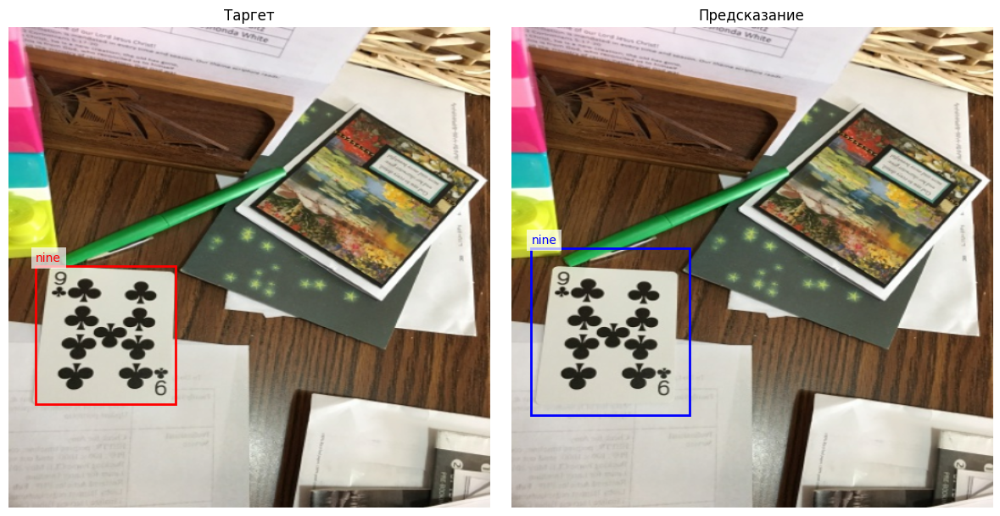

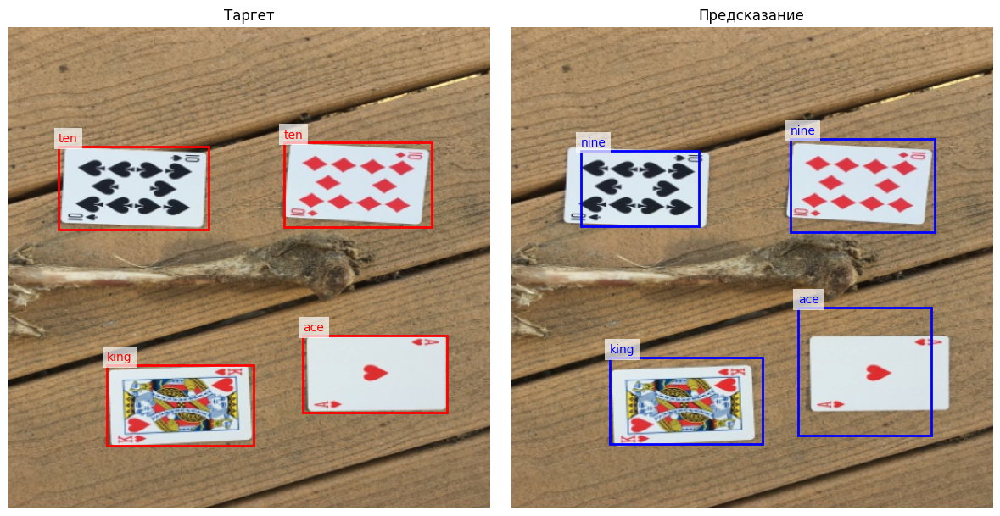

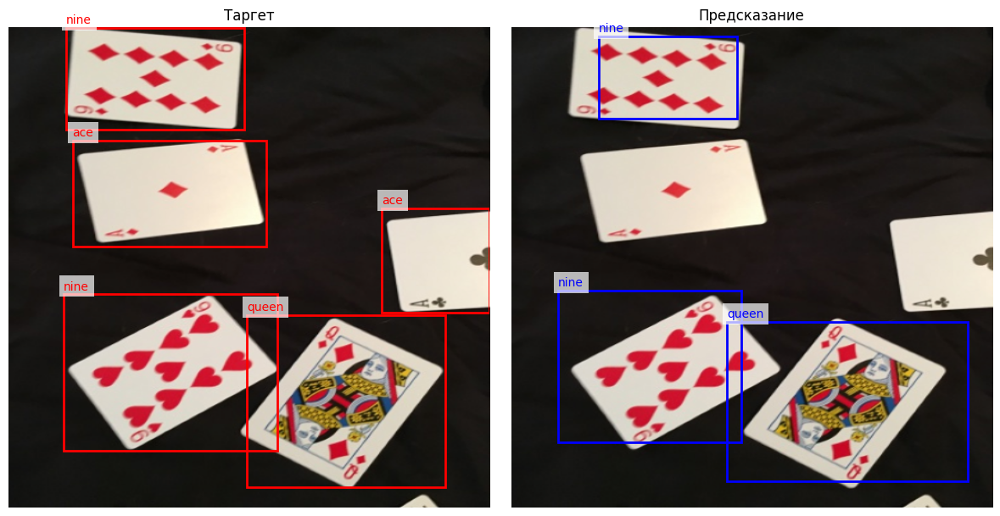

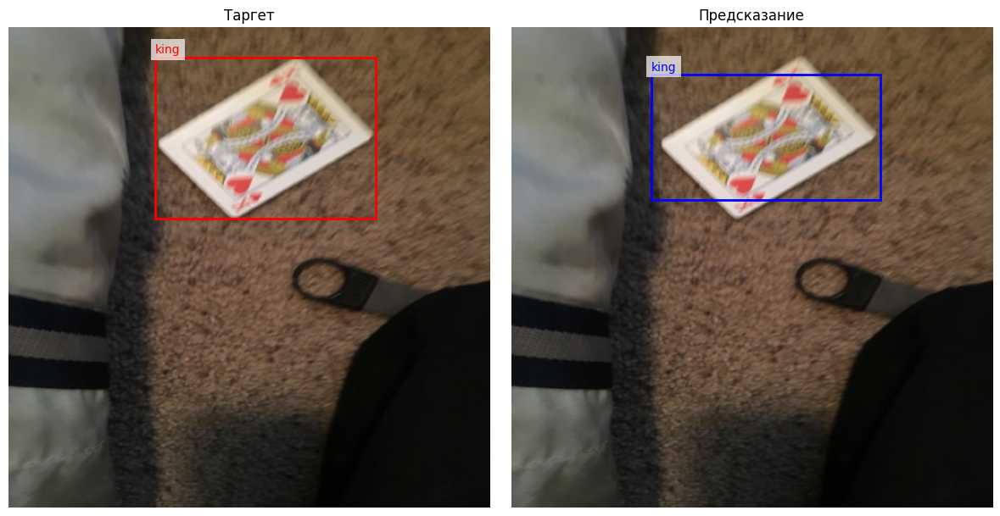

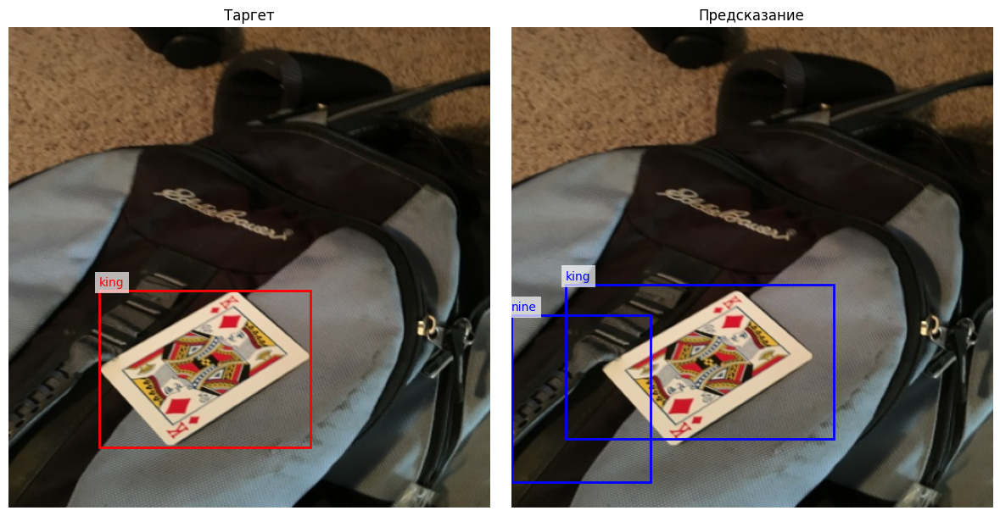

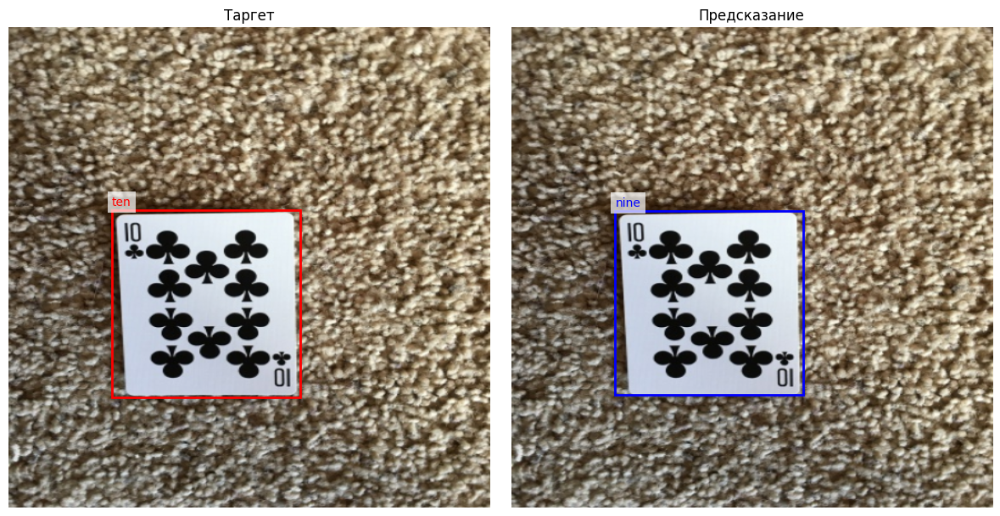

In [76]:
for i in range(len(images_cpu)):

    # преобразование для виз
    img = images_cpu[i].permute(1, 2, 0).numpy()
    img = (img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406]))  # денормализация
    img = np.clip(img, 0, 1)
    
    # Создаем фигуру
    plt.figure(figsize=(12, 6))
    
    # оригинал с таргетами
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    # bbox
    for bbox in decoded_targets[i]:
        xmin, ymin, xmax, ymax, class_id = bbox
        rect = plt.Rectangle((xmin, ymin), 
                             xmax-xmin, 
                             ymax-ymin, 
                            fill=False, 
                            color='red', 
                            linewidth=2)
        plt.gca().add_patch(rect)
        # подпись
        plt.text(xmin, 
                 ymin-5, 
                 test_ds.class_dict_inv[int(class_id)], 
                color='red', fontsize=10,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
    plt.title('Таргет')
    plt.axis('off')
    
    # оригинал с предсказаниями
    plt.subplot(1, 2, 2)
    plt.imshow(img)
    # bbox
    for bbox in decoded_preds[i]:
        xmin, ymin, xmax, ymax, class_id = bbox
        rect = plt.Rectangle((xmin, ymin), 
                             xmax-xmin, 
                             ymax-ymin, 
                            fill=False, 
                            color='blue', 
                            linewidth=2)
        plt.gca().add_patch(rect)
        # подпись
        plt.text(xmin, 
                 ymin-5, 
                 test_ds.class_dict_inv[int(class_id)], 
                color='blue', fontsize=10,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
    plt.title('Предсказание')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

Так, например, по 3-ему фото видно, что вместо трех "девяток" их стало 2 благодаря NMS

# Задача 5. 3.5 балла.

Займёмся более простыми вещами. Возьмем готовую архитектуру, обучим её на наших данных и посмотрим.

Для этого будем использовать YOLO 11 от ultralytics.

In [33]:
!pip install ultralytics

zsh:1: command not found: pip


## Задача 5.1. 1.5 балла.

Чтобы дальше модель обучалась одной строкой, данные нужно переложить в правильный формат. Да-да, классика перекладывания JSON. Как правильно паковать можно посмотреть [тут](https://roboflow.com/formats/yolov8-pytorch-txt).

Если коротко:
* Есть .yaml, где живут пути к папкам с картинками, количество классов и их названия
* Есть папочки train valid (их поможем вам собрать), в них две подпапки:
    - Первая images, в ней лежат картинки
    - Вторая labels, в ней лежат файлы с названиями как у картинок, но вместо расширения картинок нужен .txt, внутри формат как описан на Roboflow


In [77]:
# Делаем папочки
!rm -rf train
!rm -rf valid
!mkdir -p train/images train/labels valid/images valid/labels

Реализуйте функцию, которая принимает аннотации в изначальном формате, а возвращает их в нужном для YOLO 11. Это должен быть массив готовых строк, которые можно сразу забрасывать в файлик, добавив \n.

Использовать сторонние инструменты нельзя, нужно переложить своими руками.

In [78]:
def annotation2txt(bboxes, w_im, h_im):
    yolo_lines = []
    
    for bbox in bboxes:
        xmin, ymin, xmax, ymax, class_id = bbox
        
        # центр и размеры bbox
        x_center = ((xmin + xmax) / 2) / w_im
        y_center = ((ymin + ymax) / 2) / h_im
        width = (xmax - xmin) / w_im
        height = (ymax - ymin) / h_im
        
        # строка в формате YOLO
        line = f"{int(class_id)} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"
        yolo_lines.append(line)
    
    return yolo_lines

In [79]:
# Копируем картиночки по папочкам и создаем txt файлики

for i in range(len(train_ds)):
    result = train_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0],
        "./train/images/" + result[0].split("/")[-1],
    )

    h_im, w_im, ch = np.array(Image.open(result[0])).shape
    with open(
        "./train/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

for i in range(len(test_ds)):
    result = test_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0],
        "./valid/images/" + result[0].split("/")[-1],
    )
    h_im, w_im, ch = np.array(Image.open(result[0])).shape
    with open(
        "./valid/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

In [80]:
# Собираем YAML

nc =  6 # Укажите число классов. Хоть руками, хоть по-умному посчитайте (см. class_dict)
names =  ['king', 'jack', 'ace', 'ten', 'nine', 'queen'] # Укажите имена классов. Хоть руками, хоть по-умному посчитайте, это массив строк (см. class_dict)

with open("data.yaml", "w") as f:
    f.write(f"""
            train: ../train/images
            val: ../valid/images
            nc: {nc}
            names: {names}
            """
            )

## Задание 5.2. 1.5 балла.

Обучите модель YOLO 11 самого маленького размера. Библиотека максимально friendly, от вас требуется написать две строчки. Модель можно взять обученную.

Подсказка: подумайте зачем вам data.yaml и что такое yolo11n.yaml (не стесняйтесь гуглить)

Если у вас лосс NaN или Windows, то есть несколько полезных ссылок (покрывают не все существующие проблемы, но может поможет вам):

https://github.com/ultralytics/ultralytics/issues/1149

https://github.com/ultralytics/yolov5/issues/6907

https://stackoverflow.com/questions/75178762/i-got-nan-for-all-losses-while-training-yolov8-model

In [ ]:
from ultralytics import YOLO

# YOLO11
model = YOLO('yolo11n.pt')

results = model.train(
    data='data.yaml',  
    epochs=5,    
    imgsz=640, # размер картинки
    batch=8,  
    device='mps'      
)

100%|██████████| 5.35M/5.35M [00:00<00:00, 8.27MB/s]


New https://pypi.org/project/ultralytics/8.3.129 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.127 🚀 Python-3.12.9 torch-2.6.0 MPS (Apple M4 Pro)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=mps, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True,

train: Scanning /Users/vitaly/Downloads/train/labels... 326 images, 0 backgrounds, 0 corrupt: 100%|██████████| 326/326 [00:00<00:00, 4031.95it/s]

train: New cache created: /Users/vitaly/Downloads/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 501.4±157.2 MB/s, size: 100.2 KB)



val: Scanning /Users/vitaly/Downloads/valid/labels... 37 images, 0 backgrounds, 0 corrupt: 100%|██████████| 37/37 [00:00<00:00, 5204.03it/s]

val: New cache created: /Users/vitaly/Downloads/valid/labels.cache
Plotting labels to runs/detect/train2/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.57G     0.6321      3.254      1.042         21        640: 100%|██████████| 41/41 [00:19<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.23s/it]

                   all         37         74     0.0197          1      0.245      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      7.61G     0.6622       2.65      1.049         32        640: 100%|██████████| 41/41 [00:12<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/3 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 1/3 [00:03<00:06,  3.23s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.47s/it]

                   all         37         74      0.529      0.312      0.371      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.63G     0.6468      2.204      1.032         34        640: 100%|██████████| 41/41 [00:12<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/3 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 1/3 [00:03<00:06,  3.32s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.56s/it]

                   all         37         74      0.337      0.665      0.426      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.72G     0.6677      2.026      1.037         21        640: 100%|██████████| 41/41 [00:12<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/3 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 1/3 [00:03<00:06,  3.32s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.64s/it]

                   all         37         74      0.384      0.587      0.388      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.78G     0.5921       1.85      0.997         14        640: 100%|██████████| 41/41 [00:12<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/3 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 1/3 [00:03<00:06,  3.43s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.60s/it]

                   all         37         74      0.501      0.735      0.531      0.491



5 epochs completed in 0.030 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.127 🚀 Python-3.12.9 torch-2.6.0 MPS (Apple M4 Pro)
YOLO11n summary (fused): 100 layers, 2,583,322 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/3 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:11<00:00,  3.95s/it]


                   all         37         74        0.5      0.849      0.606      0.558
                  king         15         15      0.462        0.8      0.506      0.453
                  jack          8         11      0.365          1      0.547      0.518
                   ace         13         14        0.8      0.929      0.923      0.856
                   ten         10         11      0.412      0.893      0.466      0.424
                  nine         11         15      0.546      0.933        0.7       0.63
                 queen          8          8      0.416      0.537      0.491       0.47
Speed: 5.2ms preprocess, 41.3ms inference, 0.0ms loss, 157.3ms postprocess per image
Results saved to runs/detect/train2


## Задание 5.3. 0.5 балла.

Как-нибудь отрисуйте предсказания на валидационной выборке (хотя бы части из 5-10 картинок).

Здесь можно использовать костыли с параметром save=True у predict, потом прочитать их чем-нибудь, отрисовать матплотлибом. Есть варианты и получше. Дефолтный show будет пытаться показывать через opencv imshow, он в коллабе работать не будет.

In [41]:
import os


image 1/1 /Users/vitaly/Downloads/valid/images/IMG_2628.JPG: 640x480 1 king, 2 jacks, 1 ten, 1 nine, 1 queen, 34.0ms
Speed: 1.1ms preprocess, 34.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 480)


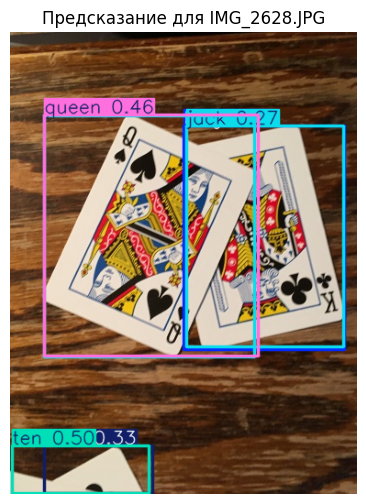


image 1/1 /Users/vitaly/Downloads/valid/images/IMG_2416.JPG: 640x480 1 ten, 1 nine, 38.1ms
Speed: 1.0ms preprocess, 38.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 480)


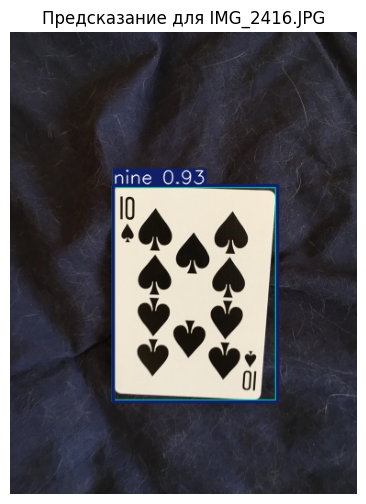


image 1/1 /Users/vitaly/Downloads/valid/images/IMG_2610.JPG: 640x480 2 kings, 4 jacks, 1 ten, 1 nine, 2 queens, 67.2ms
Speed: 1.0ms preprocess, 67.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 480)


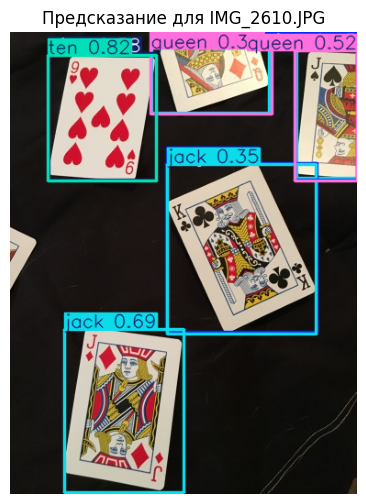


image 1/1 /Users/vitaly/Downloads/valid/images/IMG_2612.JPG: 640x480 1 king, 1 jack, 3 aces, 2 tens, 2 nines, 35.1ms
Speed: 1.1ms preprocess, 35.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 480)


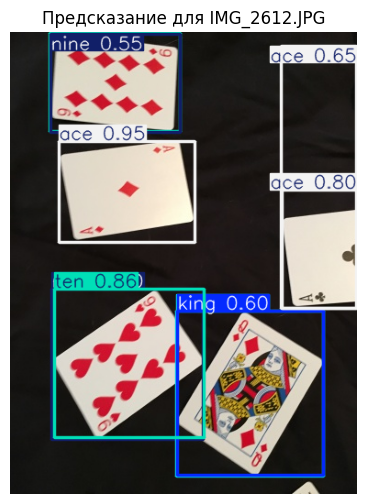


image 1/1 /Users/vitaly/Downloads/valid/images/IMG_2558.JPG: 640x480 1 ace, 2 tens, 2 nines, 1 queen, 36.0ms
Speed: 1.2ms preprocess, 36.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 480)


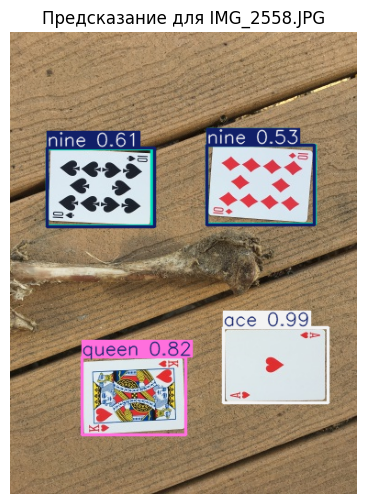

In [ ]:
model = YOLO('runs/detect/train2/weights/best.pt')
val_images = ['./valid/images/' + f for f in os.listdir('./valid/images')[:5]]

for img_path in val_images:
    try:
        # предсказание
        results = model(img_path)
        
        plt.figure(figsize=(10, 6))
        plt.imshow(results[0].plot()[:, :, ::-1]) # BGR -> RGB
        plt.title(f'Предсказание для {os.path.basename(img_path)}')
        plt.axis('off')
        plt.show()
        
    except Exception as e:
        print(f"Ошибка у {img_path}: {str(e)}")

**Выводы:** У YOLO модели значительно лучше опрделяется bbox, но она также сильно путает девятку и десятку, а еще короля и валета. Также YOLO модель лучше находит сам объект в то время как наша модель не всегда детектировала карту в целом

## Бонус (1 балл)

Реализуйте подсчет mAP для самописной модели. Если найдете готовый код на гитхабах -- используйте с указанием ссылок :)

Сравните свою модель с YOLO11. Что получается?